In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
train = pd.read_csv("house_train.csv")
test  = pd.read_csv("house_test.csv")

In [3]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
train.shape

(1460, 81)

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
len(train[train.duplicated()])
# There is no duplicated rows 

0

There is no duplicated rows in it

In [7]:
na = train.columns[train.isnull().any()]

In [8]:
#columns which are having the null values
na

Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

In [9]:
null = train[na].isnull().sum()

In [10]:
# The sum of null values of each feature
null

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

<AxesSubplot:>

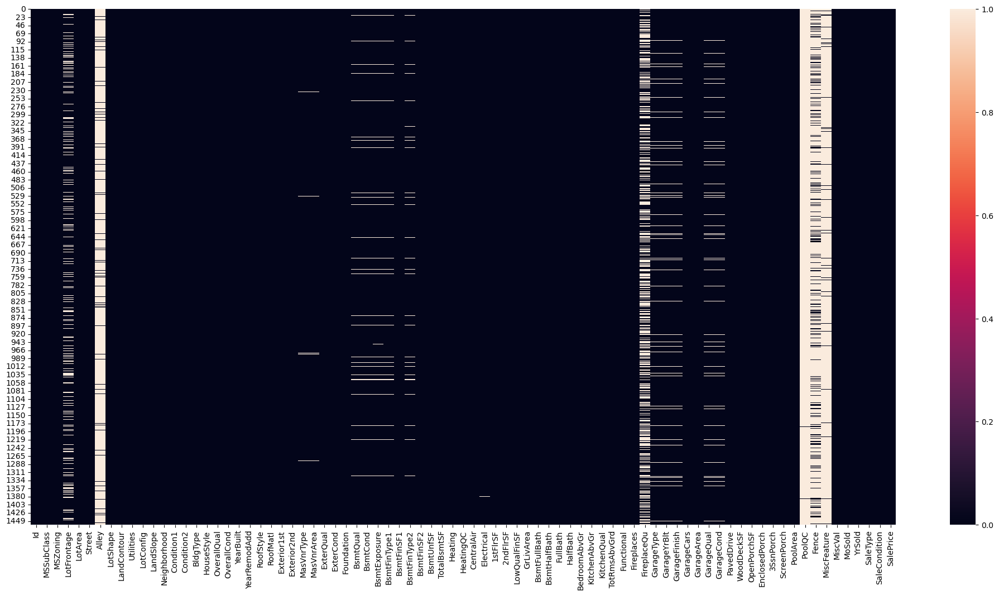

In [11]:
plt.figure(figsize=(25,12))
sns.heatmap(train.isnull())  
#we can easily understood the present of null values in each features

In [12]:
train1 = train.drop(["Id","Alley","FireplaceQu","PoolQC","Fence","MiscFeature"],axis=1)
# Drop those features which are having lots of null values because it will create biasness in the data

In [13]:
train1.shape

(1460, 75)

In [14]:
sns.pairplot(train1)

In [14]:
train1["MasVnrType"].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [15]:
len(train1[train1["MasVnrType"]=="None"])

864

In [16]:
train1["MasVnrType"].fillna("None",inplace=True)

In [17]:
train1["MasVnrType"].head(50)

0     BrkFace
1        None
2     BrkFace
3        None
4     BrkFace
5        None
6       Stone
7       Stone
8        None
9        None
10       None
11      Stone
12       None
13      Stone
14    BrkFace
15       None
16    BrkFace
17       None
18       None
19       None
20    BrkFace
21       None
22    BrkFace
23       None
24       None
25      Stone
26       None
27      Stone
28       None
29       None
30       None
31       None
32       None
33       None
34    BrkFace
35      Stone
36       None
37    BrkFace
38       None
39       None
40    BrkFace
41       None
42       None
43       None
44       None
45    BrkFace
46       None
47       None
48       None
49       None
Name: MasVnrType, dtype: object

In [18]:
train1[train1["MasVnrArea"].isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
234,60,RL,NaN,7851,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,5,2010,WD,Normal,216500
529,20,RL,NaN,32668,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,...,200,0,0,0,0,3,2007,WD,Alloca,200624
650,60,FV,65.0,8125,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,5,2008,WD,Normal,205950
936,20,RL,67.0,10083,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2009,WD,Normal,184900
973,20,FV,95.0,11639,Pave,Reg,Lvl,AllPub,Corner,Gtl,...,0,0,0,0,0,12,2008,New,Partial,182000
977,120,FV,35.0,4274,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,11,2007,New,Partial,199900
1243,20,RL,107.0,13891,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2006,New,Partial,465000
1278,60,RL,75.0,9473,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,3,2008,WD,Normal,237000


In [19]:
len(train1[train1["MasVnrArea"]==0])

861

In [20]:
mean_area = train1["MasVnrArea"].mean()
mean_area

103.68526170798899

In [21]:
median_area = train1["MasVnrArea"].median()
median_area

0.0

In [22]:
train1["MasVnrArea"].fillna(median_area,inplace=True)
# filled the null values with mode because more than half the constructer follwed it

In [23]:
len(train1[train1["MasVnrArea"].isna()])

0

In [24]:
train1["BsmtQual"].value_counts()

TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [25]:
train1["BsmtQual"].fillna("TA",inplace=True)

In [26]:
train2 = train1.copy()

In [27]:
train2

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,142125


In [28]:
len(train2[train2["BsmtQual"].isna()])

0

In [29]:
train2["BsmtQual"].value_counts()

TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [30]:
train2["BsmtCond"].value_counts()

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [31]:
train2["BsmtCond"].fillna("TA",inplace=True)
# Most of the constructer used the average quality material hence the null values are filled with that 

In [32]:
train3 = train2.copy()

In [33]:
train3["BsmtExposure"].value_counts()

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

In [34]:
train3["BsmtExposure"].fillna("No",inplace=True)

In [35]:
train4 = train3.copy()

In [36]:
train4["Electrical"].value_counts()

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [37]:
train4["Electrical"].fillna("SBrkr",inplace=True)

In [38]:
train5 = train4.copy()

In [39]:
train5["GarageType"].value_counts()

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [40]:
train5["GarageType"].fillna("Attchd",inplace=True)

In [41]:
train6 =train5.copy()

In [42]:
train6["GarageYrBlt"].value_counts()

2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
          ..
1927.0     1
1900.0     1
1906.0     1
1908.0     1
1933.0     1
Name: GarageYrBlt, Length: 97, dtype: int64

In [43]:
train6["GarageYrBlt"].median()

1980.0

In [44]:
train6["GarageYrBlt"].mean()

1978.5061638868744

In [45]:
train6["GarageYrBlt"].mode()

0    2005.0
Name: GarageYrBlt, dtype: float64

In [46]:
len(train6[train6["GarageYrBlt"]==1980])

15

In [47]:
len(train6[train6["GarageYrBlt"]>=2000])

402

In [48]:
train6["GarageYrBlt"].fillna(2000,inplace=True)

In [49]:
train7 = train6.copy()

In [50]:
train7["GarageFinish"].value_counts()

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [51]:
train7["GarageFinish"].fillna("RFn",inplace=True)

In [52]:
train8 = train7.copy()

In [53]:
train8["GarageQual"].value_counts()

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

In [54]:
train8["GarageQual"].fillna("TA",inplace=True)

In [55]:
train8["GarageCond"].value_counts()

TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

In [56]:
train9 = train8.copy()

In [57]:
train9["GarageCond"].fillna("TA",inplace=True)

In [58]:
train10 = train9.copy()

In [59]:
train10

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,142125


In [60]:
train10.columns[train10.isnull().any()]

Index(['LotFrontage', 'BsmtFinType1', 'BsmtFinType2'], dtype='object')

In [61]:
train10 .shape

(1460, 75)

In [62]:
train10.dropna(axis=0,inplace=True)

In [63]:
train10 .shape

(1169, 75)

In [64]:
train10.columns[train10.isnull().any()]

Index([], dtype='object')

In [65]:
def remove_outliers(train10, columns):
    # Create a boxplot of the DataFrame
    train10.boxplot(column=columns)
    
    # Calculate the upper and lower bounds of the boxplot for each column
    for col in columns:
        q1 = train10[col].quantile(0.25)
        q3 = train10[col].quantile(0.75)
        iqr = q3 - q1
        upper_bound = q3 + (1.5 * iqr)
        lower_bound = q1 - (1.5 * iqr)
        
        # Remove the outlier rows from the DataFrame
        train10 = train10[(train10[col] <= upper_bound) & (train10[col] >= lower_bound)]
    
    # Create a new boxplot of the DataFrame without the outliers
    train10.boxplot(column=columns)
    
    # Return the DataFrame without the outliers
    return train10

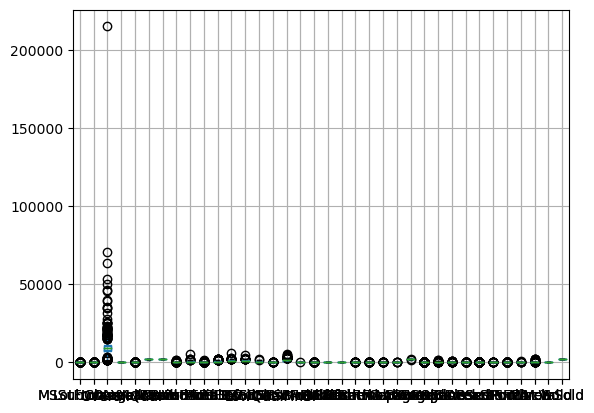

In [66]:
train11= remove_outliers(train10,['MSSubClass','LotFrontage','LotArea',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd','MasVnrArea',
       'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF','1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'])
       

In [67]:
train11.shape

(461, 75)

In [68]:
train11["YearRemodAdd"].value_counts()

2006    54
2007    40
1950    36
2005    34
2004    28
2008    19
2003    18
2000    18
2002    14
2009    12
1995    12
1999    11
1998    10
1992     8
1954     8
1997     7
1994     7
1996     6
1977     6
1972     6
1956     5
1957     5
1965     5
1962     5
2001     5
1990     5
1993     5
1959     4
1970     4
1976     4
1958     4
1969     4
1963     3
1978     3
1974     3
1967     3
1985     3
1971     3
1966     3
1960     3
1968     3
2010     2
1989     2
1975     2
1953     2
1955     2
1951     2
1982     2
1979     2
1980     2
1984     2
1952     1
1964     1
1973     1
1961     1
1991     1
Name: YearRemodAdd, dtype: int64

In [69]:
train11

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,307000
10,20,RL,70.0,11200,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1444,20,RL,63.0,8500,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,11,2007,WD,Normal,179600
1448,50,RL,70.0,11767,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,112000
1451,20,RL,78.0,9262,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,5,2009,New,Partial,287090
1454,20,FV,62.0,7500,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,10,2009,WD,Normal,185000


In [70]:
train12 = train11.drop(["MiscVal","PoolArea","ScreenPorch","3SsnPorch","EnclosedPorch","KitchenAbvGr","BsmtHalfBath","LowQualFinSF","BsmtFinSF2"],axis=1)

In [71]:
train12.shape

(461, 66)

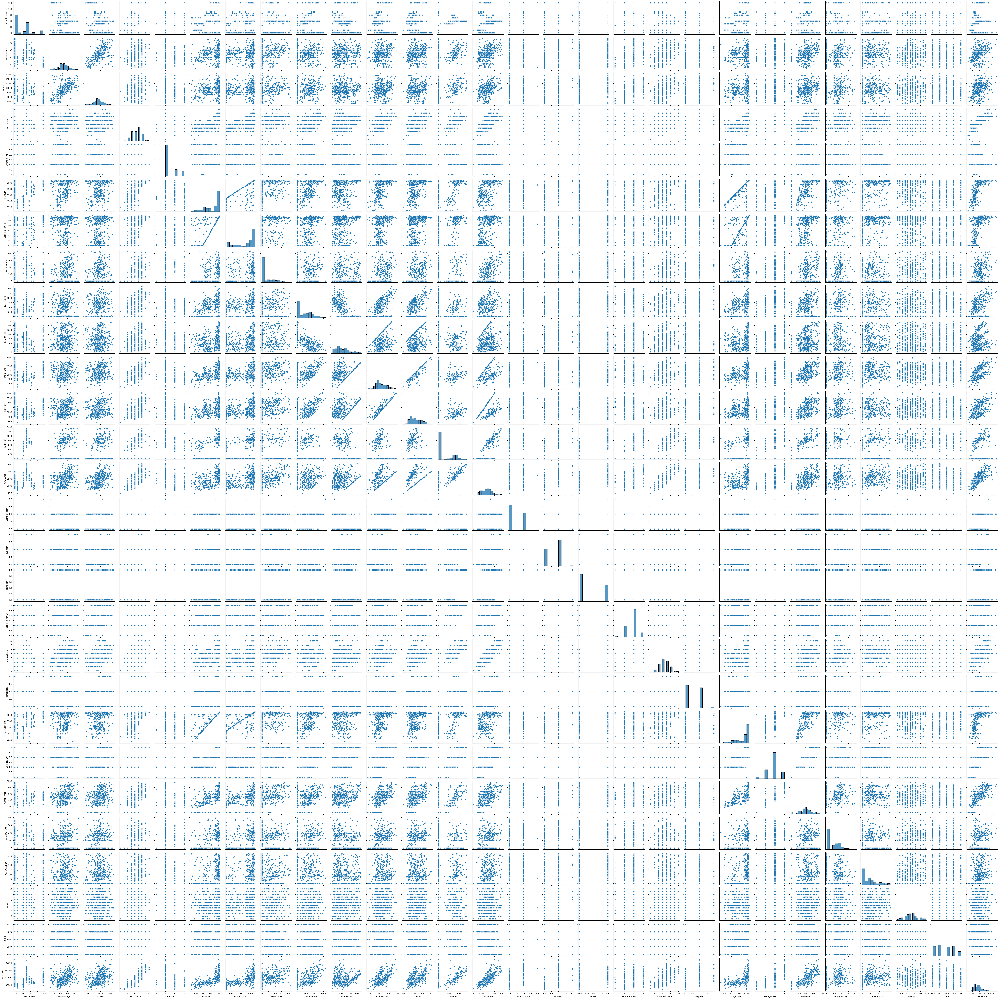

In [72]:
sns.pairplot(train12)

In [72]:
train12["SaleCondition"].value_counts()

Normal     356
Partial     71
Abnorml     27
Family       5
AdjLand      1
Alloca       1
Name: SaleCondition, dtype: int64

In [73]:
train13 = train12.drop(['Street','Utilities','LandSlope','Condition2','RoofMatl','BsmtFinSF1','BsmtFinType2','BsmtUnfSF','Heating','CentralAir','Electrical','GarageQual','GarageCond','PavedDrive'],axis=1)

In [74]:
train13.shape

(461, 52)

In [75]:
train13.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'TotalBsmtSF', 'HeatingQC', '1stFlrSF',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold',
       'SaleType', 'SaleCondition', 'SalePrice'],
      dtype='object')

In [76]:
train14 = train13.copy()

In [77]:
train15=pd.get_dummies(train14[["MSZoning","LandContour","LotConfig","Neighborhood","Condition1","BldgType","HouseStyle","RoofStyle","Exterior1st","Exterior2nd","MasVnrType","Foundation","Functional","GarageType","SaleType","SaleCondition"]])

In [78]:
train16 = pd.concat([train14,train15],axis=1)

In [79]:
train17 = train16.drop(["MSZoning","LandContour","LotConfig","Neighborhood","Condition1","BldgType","HouseStyle","RoofStyle","Exterior1st","Exterior2nd","MasVnrType","Foundation","Functional","GarageType","SaleType","SaleCondition"],axis=1)

In [80]:
train17.shape

(461, 145)

In [81]:
train17

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,Reg,7,5,2003,2003,196.0,Gd,...,0,0,0,1,0,0,0,0,1,0
2,60,68.0,11250,IR1,7,5,2001,2002,162.0,Gd,...,0,0,0,1,0,0,0,0,1,0
4,60,84.0,14260,IR1,8,5,2000,2000,350.0,Gd,...,0,0,0,1,0,0,0,0,1,0
6,20,75.0,10084,Reg,8,5,2004,2005,186.0,Gd,...,0,0,0,1,0,0,0,0,1,0
10,20,70.0,11200,Reg,5,5,1965,1965,0.0,TA,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1444,20,63.0,8500,Reg,7,5,2004,2004,106.0,Gd,...,0,0,0,1,0,0,0,0,1,0
1448,50,70.0,11767,Reg,4,7,1910,2000,0.0,TA,...,0,0,0,1,0,0,0,0,1,0
1451,20,78.0,9262,Reg,8,5,2008,2009,194.0,Gd,...,0,1,0,0,0,0,0,0,0,1
1454,20,62.0,7500,Reg,7,5,2004,2005,0.0,Gd,...,0,0,0,1,0,0,0,0,1,0


In [82]:
train17["LotShape"].value_counts()

Reg    305
IR1    151
IR2      3
IR3      2
Name: LotShape, dtype: int64

In [83]:
train17["LotShape"].replace({"Reg":4,"IR1":3,"IR2":2,"IR3":1},inplace=True)

In [84]:
train18 = train17.copy()

In [85]:
train18["ExterCond"].replace({"Fa":1,"TA":2,"Gd":3},inplace=True)

In [86]:
train18["ExterCond"].value_counts()

2    431
3     27
1      3
Name: ExterCond, dtype: int64

In [87]:
train19 =train18.copy()

In [88]:
train19["BsmtQual"].replace({"Fa":1,"TA":2,"Gd":3,"Ex":4},inplace=True)

In [89]:
train20 = train19.copy()

In [90]:
train19["BsmtCond"].replace({"Fa":1,"TA":2,"Gd":3},inplace=True)

In [91]:
train20 = train19.copy()

In [92]:
train20["BsmtExposure"].replace({"No":1,"Mn":2,"Av":3,"Gd":4},inplace=True)

In [93]:
train21 = train20.copy()

In [94]:
train21["BsmtFinType1"].replace({"GLQ":6,"ALQ":5,"BLQ":4,"Rec":3,"LwQ":2,"Unf":1},inplace=True)

In [95]:
train22 = train21.copy()

In [96]:
train22["HeatingQC"].replace({"Fa":1,"TA":2,"Gd":3,"Ex":4},inplace=True)

In [97]:
train23 = train22.copy()

In [98]:
train23["KitchenQual"].replace({"Fa":1,"TA":2,"Gd":3,"Ex":4},inplace=True)

In [99]:
train24 = train23.copy()

In [100]:
train24["GarageFinish"].replace({"Unf":1,"RFn":2,"Fin":3},inplace=True)

In [101]:
train25 = train24.copy()

In [102]:
train25.shape

(461, 145)

In [103]:
train25["ExterQual"].value_counts()

TA    227
Gd    224
Ex      9
Fa      1
Name: ExterQual, dtype: int64

In [104]:
train25["ExterQual"].replace({"Fa":1,"TA":2,"Gd":3,"Ex":4},inplace=True)

In [105]:
train26 = train25.copy()

In [106]:
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split

In [107]:
data =pd.DataFrame(minmax_scale(train25),columns=train25.columns)
# preprocessed the data because each features have different range of values to give average weightage we have preprocess it

In [108]:
data

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.4,0.426829,0.411622,1.000000,0.625,0.333333,0.939394,0.883333,0.450575,0.666667,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.4,0.463415,0.623487,0.666667,0.625,0.333333,0.919192,0.866667,0.372414,0.666667,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.4,0.658537,0.851241,0.666667,0.750,0.333333,0.909091,0.833333,0.804598,0.666667,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.548780,0.535260,1.000000,0.750,0.333333,0.949495,0.916667,0.427586,0.666667,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.487805,0.619703,1.000000,0.375,0.333333,0.555556,0.250000,0.000000,0.333333,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456,0.0,0.402439,0.415406,1.000000,0.625,0.333333,0.949495,0.900000,0.243678,0.666667,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
457,0.3,0.487805,0.662606,1.000000,0.250,1.000000,0.000000,0.833333,0.000000,0.333333,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
458,0.0,0.585366,0.473063,1.000000,0.750,0.333333,0.989899,0.983333,0.445977,0.666667,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
459,0.0,0.390244,0.339740,1.000000,0.625,0.333333,0.949495,0.916667,0.000000,0.666667,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [109]:
y = train26["SalePrice"]
y

0       208500
2       223500
4       250000
6       307000
10      129500
         ...  
1444    179600
1448    112000
1451    287090
1454    185000
1455    175000
Name: SalePrice, Length: 461, dtype: int64

## TO TEST AND TRAIN THE DATA

In [110]:
x_train,x_test,y_train,y_test = train_test_split(data,y,test_size=0.2,random_state=3)

In [111]:
train26.shape

(461, 145)

## MODEL USING RANDOM FOREST

In [112]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [113]:
rfr = RandomForestRegressor(random_state=42)

In [114]:
rfr = RandomForestRegressor(max_depth = 7, min_samples_leaf= 5, min_samples_split= 10, n_estimators= 50)

In [115]:
rfr = rfr.fit(x_train, y_train)

In [116]:
y_train_preds = rfr.predict(x_train)
y_train_preds

array([175204.32449462, 155093.64852995, 196108.63651299, 114653.65551398,
       105714.5240516 , 184046.03606843, 285344.50533424, 184943.33143329,
       227513.56996878, 109937.39523642, 107741.62815949, 108164.80917293,
       200306.69357958, 132320.17587851, 209384.9858375 , 196108.63651299,
       146832.42793448, 132546.87248745, 206927.91132091, 195642.12594156,
       184067.49782889, 128977.92102258, 126031.58548902, 219894.57504242,
       186001.86730769, 145128.29314631, 254807.51646697, 119370.47676314,
       292770.60270909, 109230.45971261, 206858.94882091, 151796.53901178,
       307020.36627556, 139923.17564246, 202931.37110989, 142577.78260982,
       317791.55808658, 231663.32105999, 136524.2581595 , 276258.87630915,
        73621.06967236, 268189.43072427, 227442.94774655,  73621.06967236,
       265865.23230158, 268434.60739093, 213989.27375083, 118681.28590333,
       113435.75527954, 192385.21249468, 144194.97168167, 127012.34671113,
       158056.5075137 , 1

In [117]:
y_test_preds = rfr.predict(x_test)
y_test_preds[0:10]

array([245906.45364202, 178379.31007759, 134610.88977689, 116768.05947255,
       139137.6278187 , 213989.27375083, 237012.02622226, 208025.81803863,
       151796.53901178, 173864.12947874])

In [118]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate the regression error metrics
mae = mean_absolute_error(y_train, y_train_preds)
mse = mean_squared_error(y_train, y_train_preds)
rmse = mean_squared_error(y_train, y_train_preds, squared=False)
r2 = r2_score(y_train, y_train_preds)

    # Print the report
print(f"Mean Absolute Error: {mae:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Root Mean Squared Error: {rmse:.3f}")
print(f"R-squared: {r2:.3f}")

Mean Absolute Error: 989.037
Mean Squared Error: 15423401.834
Root Mean Squared Error: 3927.264
R-squared: 0.996


In [119]:
r2 = r2_score(y_test, y_test_preds)
r2

0.9843543284071633

In [120]:
rfr.predict(pd.DataFrame(data.iloc[0:5,:]))

array([208475.28838496, 223102.85319463, 250601.70349684, 308708.55845138,
       129428.91697108])

In [121]:
a=pd.DataFrame(y_test_preds)
b=pd.DataFrame(y_test)

In [122]:
a.rename({0:"predicted"},axis=1,inplace=True)

In [123]:
a=np.round(a)

In [124]:
b.reset_index(drop=True,inplace=True)

In [125]:
pd.concat([b,a],axis=1)

,SalePrice,predicted
0,245350,245906.0
1,178000,178379.0
2,135000,134611.0
3,116050,116768.0
4,139000,139138.0
...,...,...
88,219500,219749.0
89,176000,175672.0
90,127500,127056.0
91,119000,119221.0


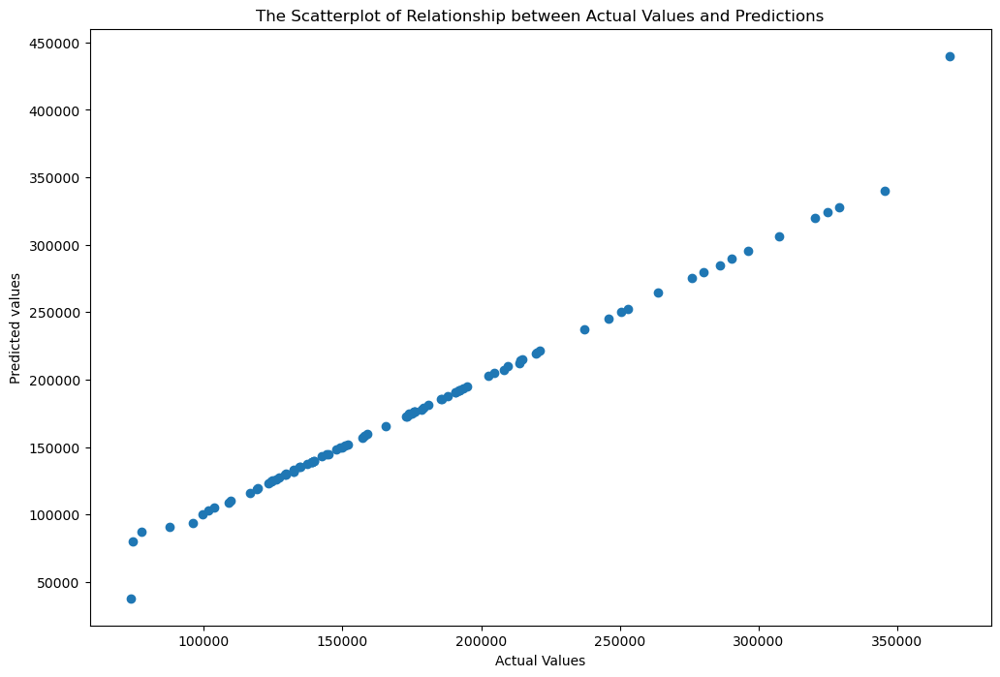

In [126]:
plt.figure(figsize=(12,8))
plt.xlabel("Actual Values")
plt.ylabel("Predicted values")
plt.title("The Scatterplot of Relationship between Actual Values and Predictions")
plt.scatter(a,b)